In [ ]:
pip install opencv-python ultralytics numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 72.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 58.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
from ultralytics import YOLO
import random
import cv2
import numpy as np
import torch
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import time

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO("yolov8m-seg.pt")

100%|██████████| 52.4M/52.4M [00:00<00:00, 67.6MB/s]


In [ ]:
#source : https://www.geeksforgeeks.org/calculation-intersection-over-union-iou-for-evaluating-an-image-segmentation-model-using-java/

def getIoU(gt, pred):

        tp, fp, fn = 0,0,0
        white, black  = [255,255,255], [0,0,0]

        for i in range(gt.shape[0]):
            for j in range(len(gt[0])):
                if (gt[i][j] == white).all() and (pred[i][j] == white).all():
                    tp += 1
                elif (gt[i][j] == black).all() and (pred[i][j] == white).all():
                    fp += 1
                elif (gt[i][j] == white).all() and (pred[i][j] == black).all():
                    fn += 1

        # Calculate IoU
        iou = tp / (tp + fp + fn)
        print('done')
        return iou


In [ ]:
def doSegmentation (img, verb=False) :
  return model.predict(img, conf=0.5, verbose=verb)

In [ ]:
def applyBinaryMask(results,img, black_out=True) :

  for result in results:
    for mask, box in zip(result.masks.xy, result.boxes):
        points = np.int32([mask])
        cv2.fillPoly(img, points,  color=(255, 255, 255))

  if black_out :
    img[img != 255] = 0

  return img

In [ ]:
def readFiles(paths) :
  images = []
  for i in paths :
    images.append(cv2.imread(i))
  return images

In [ ]:
hw_paths = ['./hw/in00' + str(i) + '.jpg' for i in range(1100,1500 + 1)]
gt_paths = ['./gt/gt00' + str(i) + '.png' for i in range(1100,1500 + 1)]

In [ ]:
hw_img = readFiles(hw_paths)
gt_img = readFiles(gt_paths)

#Precision Test

In [ ]:
#get the binary segmentation for our images
segmented_img = []
for img in hw_img[0:101] :
  segmented_img.append(doSegmentation(img))


0: 480x640 4 cars, 1378.7ms
Speed: 16.8ms preprocess, 1378.7ms inference, 39.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 cars, 1104.2ms
Speed: 2.7ms preprocess, 1104.2ms inference, 9.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 cars, 1372.7ms
Speed: 3.5ms preprocess, 1372.7ms inference, 12.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 cars, 1103.1ms
Speed: 5.1ms preprocess, 1103.1ms inference, 9.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 cars, 1070.2ms
Speed: 3.4ms preprocess, 1070.2ms inference, 9.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 cars, 1094.1ms
Speed: 3.7ms preprocess, 1094.1ms inference, 10.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 cars, 1088.6ms
Speed: 5.0ms preprocess, 1088.6ms inference, 10.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 cars, 1097.4ms
Speed: 3.2ms preprocess, 1097.4ms inference, 9.7ms postprocess per ima

In [ ]:
#Turn our segmented images into binary images
binary_hw = []
for i in range(len(segmented_img)) :
  binary_hw.append(applyBinaryMask(segmented_img[i], hw_img[i]))

In [ ]:
#get all the IoU scores
scores = []
for i in range(len(binary_hw)) :
  scores.append(getIoU(gt_img[i],binary_hw[i]))

done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done


{'whiskers': [<matplotlib.lines.Line2D at 0x7829ae55e2d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7829ae55f790>,
 'boxes': [<matplotlib.lines.Line2D at 0x7829ae55d9d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7829ae5a8c10>],
 'fliers': [<matplotlib.lines.Line2D at 0x7829ae5a9590>],
 'means': []}

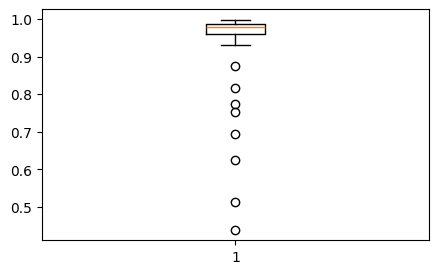

In [ ]:
fig = plt.figure(figsize =(5, 3))
plt.boxplot(scores)

In [ ]:
av = np.average(scores)
med = np.median(scores)
min = np.min(scores)
print('average : ' + str(av) + '\n'
      + 'median : ' + str(med) + '\n'
      + 'minimum :' + str(min))

average : 0.9527742132924704
median : 0.9786521557136877
minimum :0.43945658594211456


#Performance test

In [ ]:
def get_time(img_list) :
  start_time = time.time()
  for img in img_list :
    doSegmentation(img)
  end_time = time.time()
  return end_time - start_time

In [ ]:
time_arr = []

#1 img
time_arr.append(get_time(hw_img[0:1]))

#10 img
time_arr.append(get_time(hw_img[0:10]))

#25 img
time_arr.append(get_time(hw_img[0:25]))

#50 img
time_arr.append(get_time(hw_img[0:50]))

#100 img
time_arr.append(get_time(hw_img[0:100]))

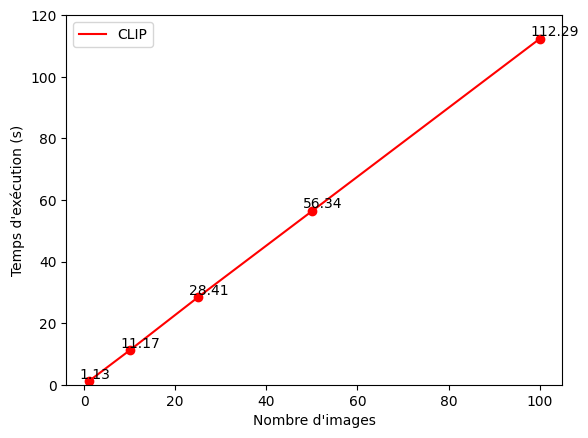

In [ ]:
#Plotting the results
time_arr = np.round(time_arr,2)
plt.xlabel("Nombre d'images")
plt.ylabel("Temps d'exécution (s)")
nb_images = [1,10,25,50,100]
plt.scatter(nb_images, time_arr, color = 'red')
plt.plot(nb_images, time_arr, label = 'CLIP', color = 'red')
plt.ylim(0, 120)
for i, txt in enumerate(time_arr):
    plt.annotate(str(txt), (nb_images[i] - 2, time_arr[i] + 1))
plt.legend()
plt.show()

#Multi object image test

In [ ]:
yolo_classes = list(model.names.values())
classes_ids = [yolo_classes.index(clas) for clas in yolo_classes]
colors = [random.choices(range(256), k=3) for _ in classes_ids]

In [ ]:
def applyColoredMask(results,img) :
  for result in results:
    for mask, box in zip(result.masks.xy, result.boxes):
      points = np.int32([mask])
      color_number = classes_ids.index(int(box.cls[0]))
      cv2.fillPoly(img, points, colors[color_number])
      return img

In [ ]:
def segPipeline(path,verb,binary=True,black_out=True,resize=False,dim=(0,0), getConf=False) :
  img = cv2.imread(path)

  if(resize) :
    img = cv2.resize(img,dim)

  seg = doSegmentation(img, verb=verb)
  masked_img = []

  if(binary) :
    masked_img = applyBinaryMask(seg, img, black_out=black_out)
  else :
    masked_img = applyColoredMask(seg, img)

  if getConf :
    return masked_img, seg[0].boxes.conf
  else:
    return masked_img


0: 640x640 4 persons, 1 bench, 2098.3ms
Speed: 6.2ms preprocess, 2098.3ms inference, 20.1ms postprocess per image at shape (1, 3, 640, 640)


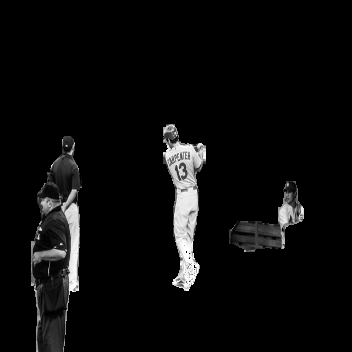

In [ ]:
original_img = cv2.imread('./baseball.png')
img = segPipeline('./baseball.png',verb=True,black_out=False, resize=True,dim=(352,352))
detected_areas = cv2.cvtColor(cv2.resize(original_img,(352,352)) - img, cv2.COLOR_BGR2GRAY)
cv2_imshow(detected_areas)

object missing : cellphone, many other people, many other chairs, hats


0: 640x640 1 person, 2 wine glasss, 2 bowls, 1 chair, 1 couch, 1 dining table, 3111.7ms
Speed: 5.9ms preprocess, 3111.7ms inference, 49.2ms postprocess per image at shape (1, 3, 640, 640)


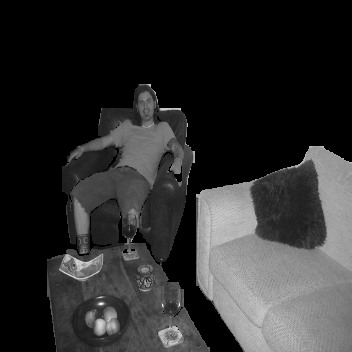

In [ ]:
original_img = cv2.imread('./room_2.jpg')
img = segPipeline('./room_2.jpg',verb=True,black_out=False,resize=True,dim=(352,352))
detected_areas = cv2.cvtColor(cv2.resize(original_img,(352,352)) - img, cv2.COLOR_BGR2GRAY)
cv2_imshow(detected_areas)

object missing : fridge, 3 apples, one guitard, one sofa, books, heaters

#Zero shot test


0: 448x640 1 suitcase, 1414.4ms
Speed: 4.2ms preprocess, 1414.4ms inference, 4.3ms postprocess per image at shape (1, 3, 448, 640)


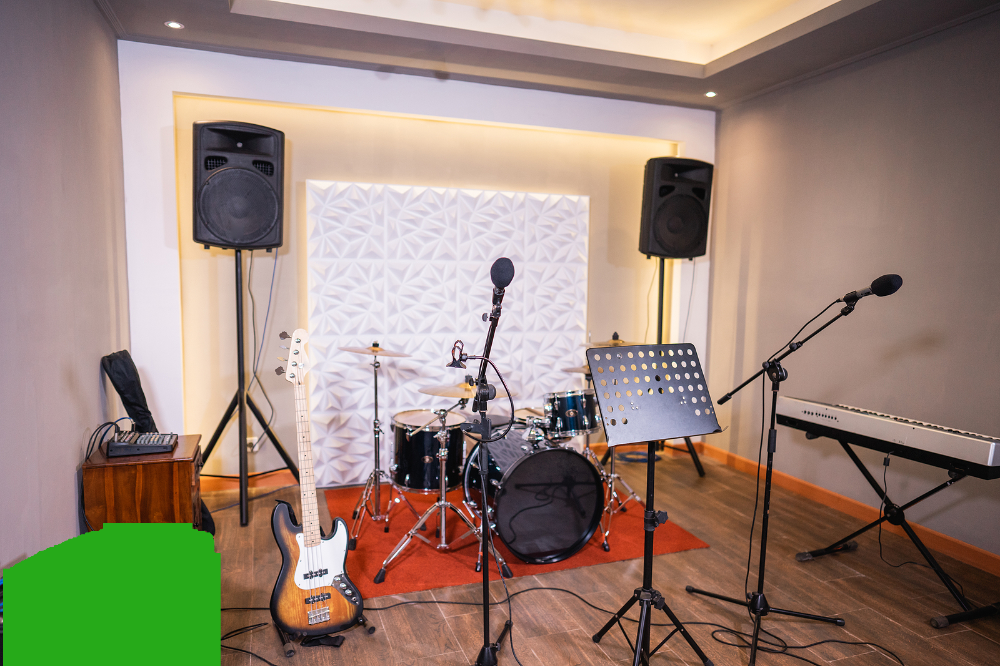

In [ ]:
#Lets see how yolo react when it analyzes images it was not trained on
#Can he detect the different instruments ?
img = segPipeline('./studio.jpg',verb=True,binary=False)
cv2_imshow(img)


0: 480x640 1 bird, 1541.4ms
Speed: 4.7ms preprocess, 1541.4ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)


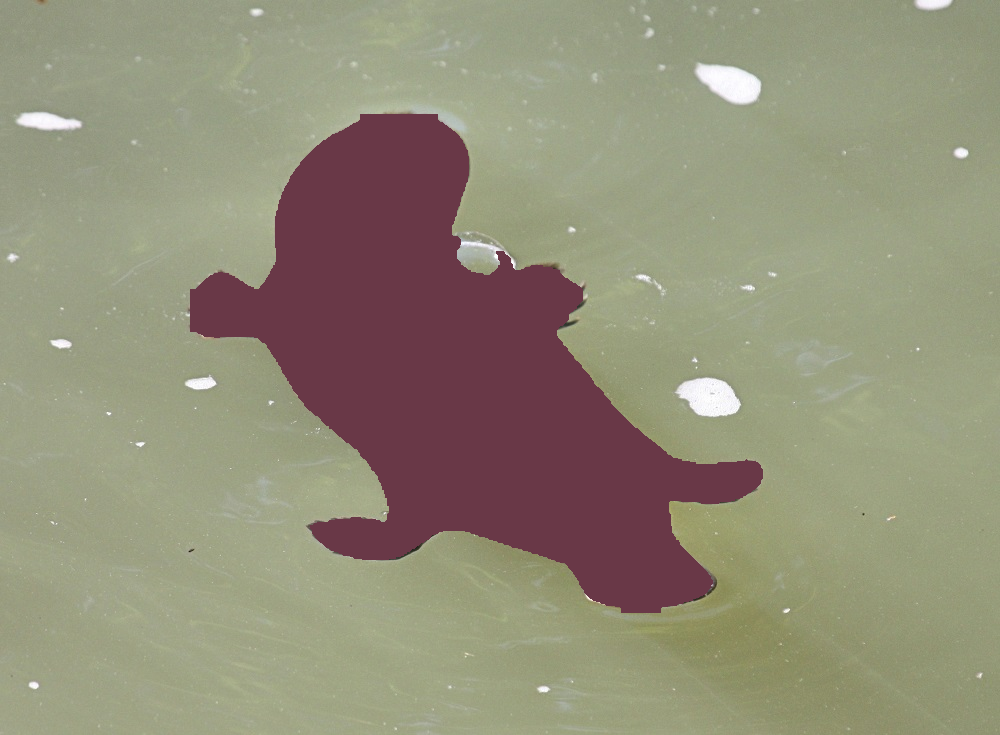

In [ ]:
# lets test with confusing animals like a platypus and a sea horse
img, conf = segPipeline('./platypus.jpg',verb=True,binary=False,getConf=True)
cv2_imshow(img)

In [ ]:
print(conf)

tensor([0.8800])



0: 448x640 1 bird, 2169.7ms
Speed: 5.5ms preprocess, 2169.7ms inference, 3.0ms postprocess per image at shape (1, 3, 448, 640)


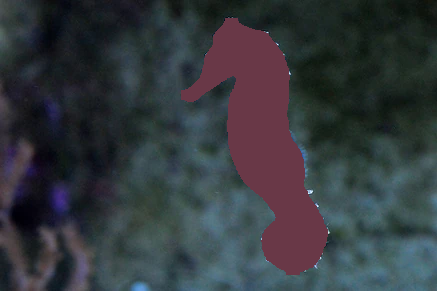

In [ ]:
# lets test with confusing animals like a platypus, sea horse and an octopus
img,conf = segPipeline('./SeaHorse.jpg',verb=True,binary=False,getConf=True)
cv2_imshow(img)

In [ ]:
print(conf)

tensor([0.8992])


In [ ]:
# lets test with confusing animals like a platypus, sea horse and an octopus
zero_shot_img = cv2.imread('./octopus.jpg')
seg_zero_shot_img = doSegmentation(zero_shot_img, verb=True)


0: 384x640 (no detections), 1225.0ms
Speed: 4.5ms preprocess, 1225.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



0: 480x640 1 cat, 2087.6ms
Speed: 12.9ms preprocess, 2087.6ms inference, 3.3ms postprocess per image at shape (1, 3, 480, 640)


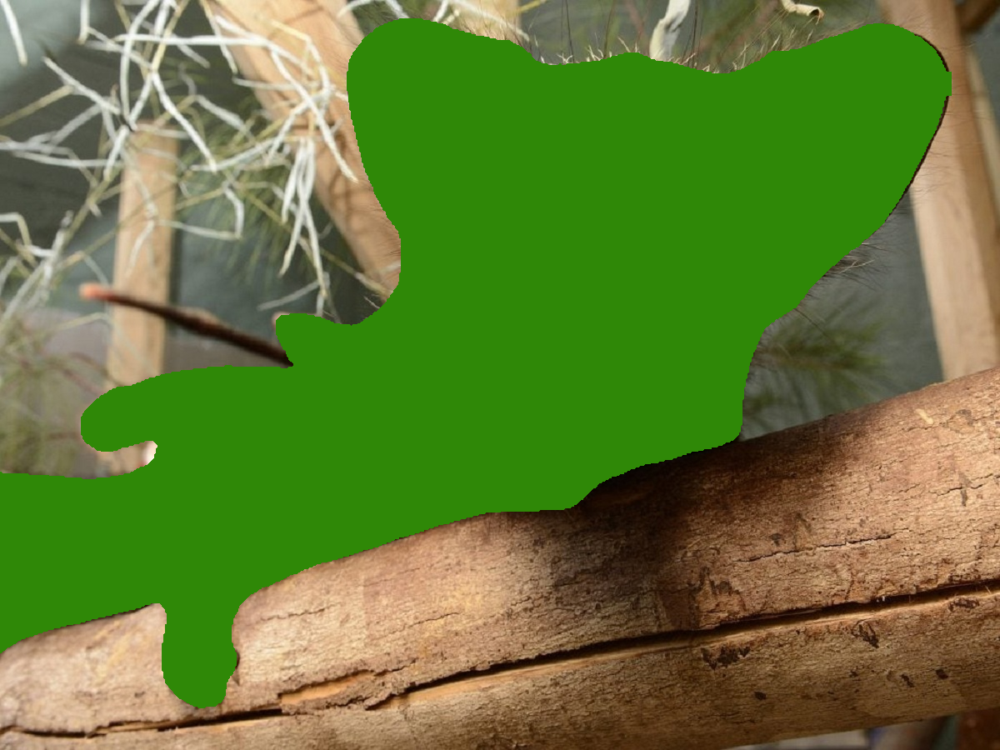

In [ ]:
img,conf = segPipeline('./aye-aye.jpg',verb=True,binary=False,getConf=True)
cv2_imshow(img)

In [ ]:
print(conf)

tensor([0.6414])


# Occlusion


0: 480x640 9 persons, 3 bicycles, 6 cars, 4 traffic lights, 1 parking meter, 2 backpacks, 2749.7ms
Speed: 11.6ms preprocess, 2749.7ms inference, 222.0ms postprocess per image at shape (1, 3, 480, 640)


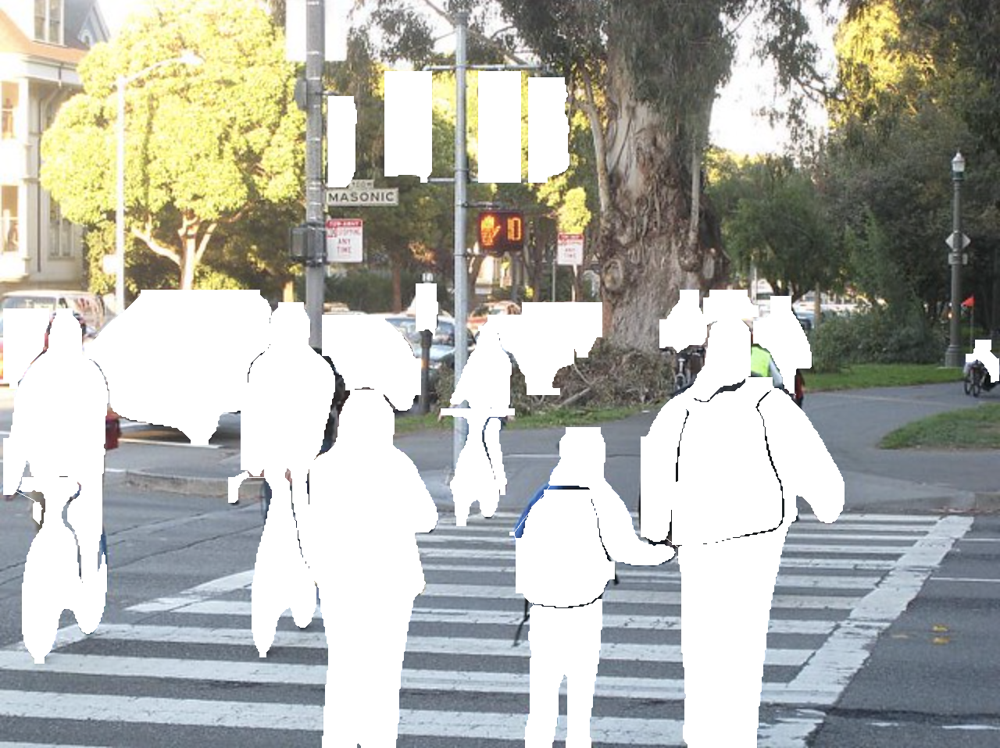

In [ ]:
# Lets see how good Yolo deals with known occluded object
img = segPipeline('./crosswalk.png',verb=True,binary=True,black_out=False)
cv2_imshow(img)

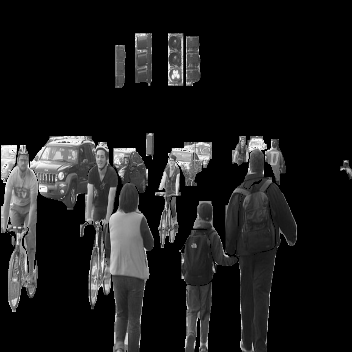

In [ ]:
orignal_img = cv2.imread('./crosswalk.png')
sub_img = orignal_img - img
cv2_imshow(cv2.cvtColor(cv2.resize(sub_img, (352,352)),cv2.COLOR_BGR2GRAY))


0: 448x640 10 persons, 1 car, 1 truck, 1 handbag, 1734.1ms
Speed: 13.6ms preprocess, 1734.1ms inference, 33.8ms postprocess per image at shape (1, 3, 448, 640)


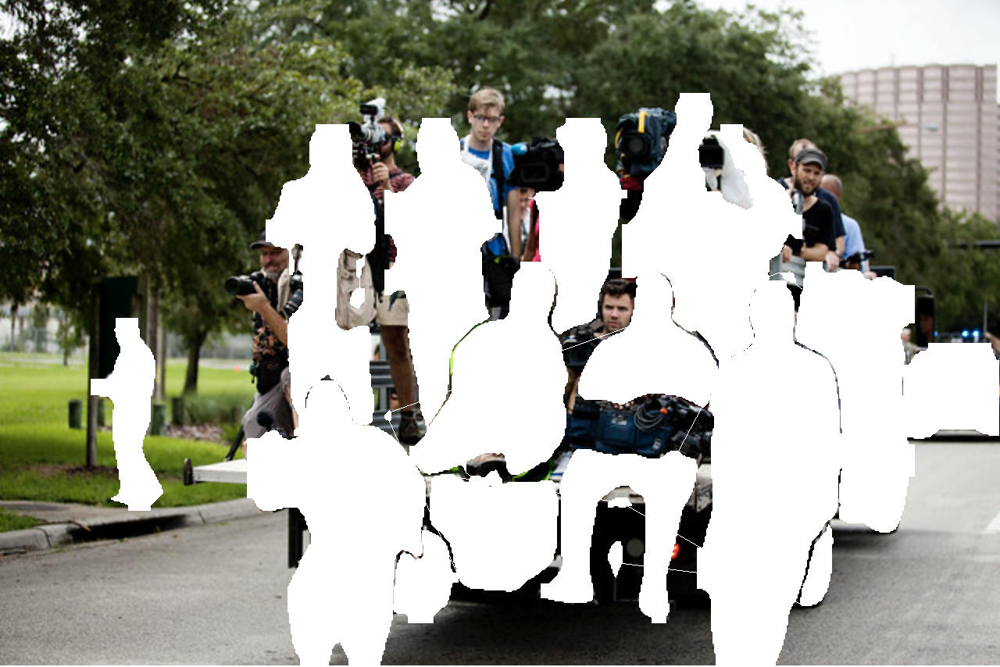

In [ ]:
img = segPipeline('./cameracrew.png',verb=True,binary=True,black_out=False)
cv2_imshow(img)

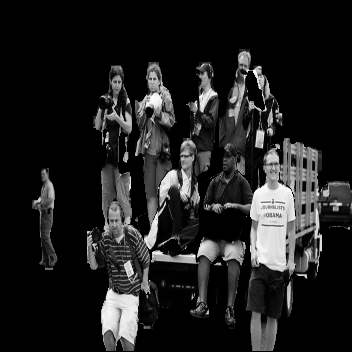

In [ ]:
orignal_img = cv2.imread('./cameracrew.png')
sub_img = orignal_img - img
cv2_imshow(cv2.cvtColor(cv2.resize(sub_img, (352,352)),cv2.COLOR_BGR2GRAY))

# Small object


0: 448x640 1 person, 2 couchs, 2 tvs, 1482.8ms
Speed: 17.1ms preprocess, 1482.8ms inference, 48.3ms postprocess per image at shape (1, 3, 448, 640)


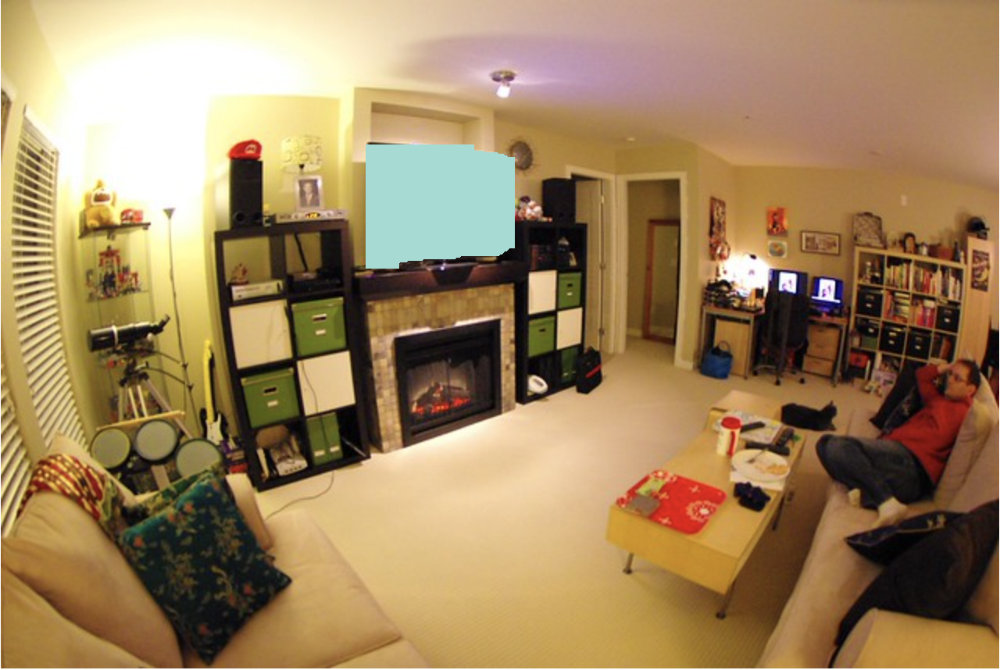

In [ ]:
#Lets see how many zoom are necessary for YOLO to detect a small fork
img = segPipeline('./smallFork.png',verb=True,binary=False)
cv2_imshow(img)


0: 448x640 1 person, 1 cup, 1 couch, 2 tvs, 1 book, 1015.6ms
Speed: 2.7ms preprocess, 1015.6ms inference, 10.2ms postprocess per image at shape (1, 3, 448, 640)


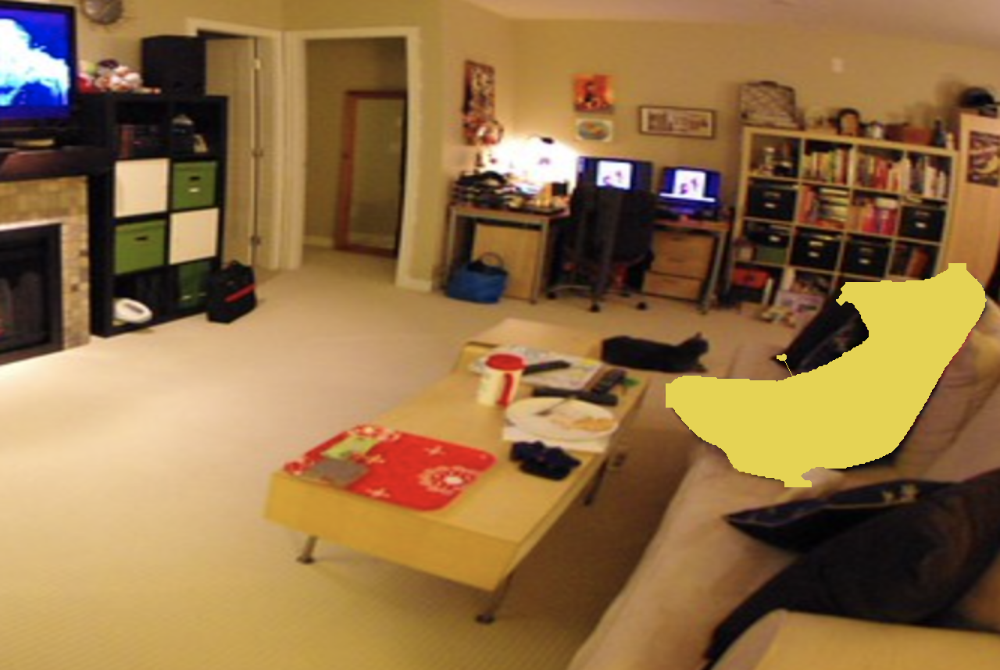

In [ ]:
#Zoom 1
img = segPipeline('./smallFork _zoom1.png',verb=True,binary=False,resize=True,dim=(1280,858))
cv2_imshow(img)


0: 448x640 1 person, 1 chair, 1 couch, 1 dining table, 1 remote, 1 book, 1258.8ms
Speed: 5.1ms preprocess, 1258.8ms inference, 10.6ms postprocess per image at shape (1, 3, 448, 640)


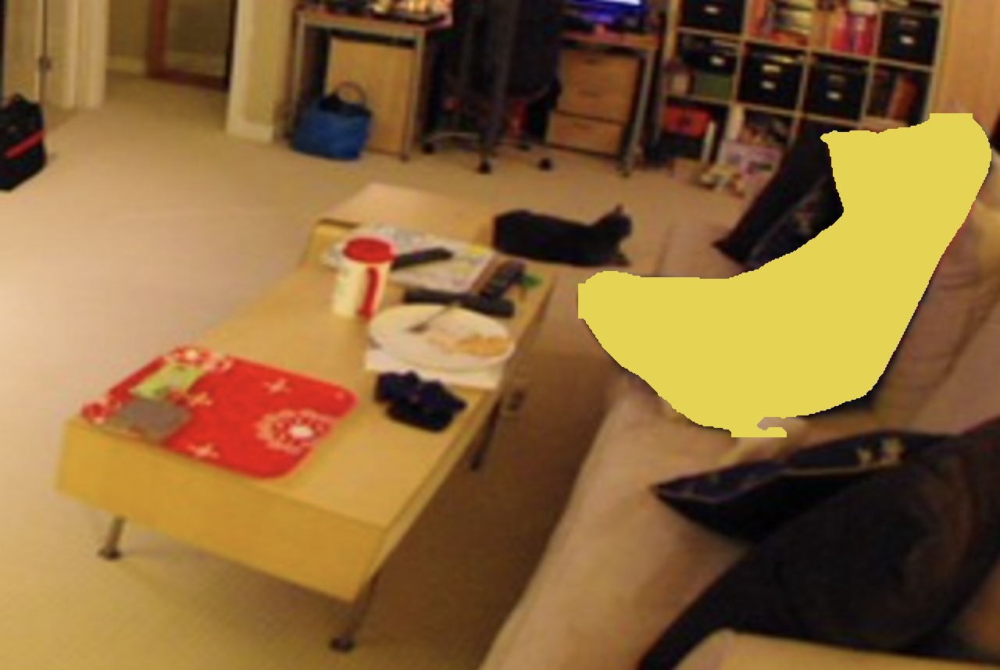

In [ ]:
#Zoom 2
img = segPipeline('./smallFork _zoom2 .png',verb=True,binary=False,resize=True,dim=(1280,858))
cv2_imshow(img)


0: 448x640 1 cup, 1198.2ms
Speed: 3.2ms preprocess, 1198.2ms inference, 3.1ms postprocess per image at shape (1, 3, 448, 640)


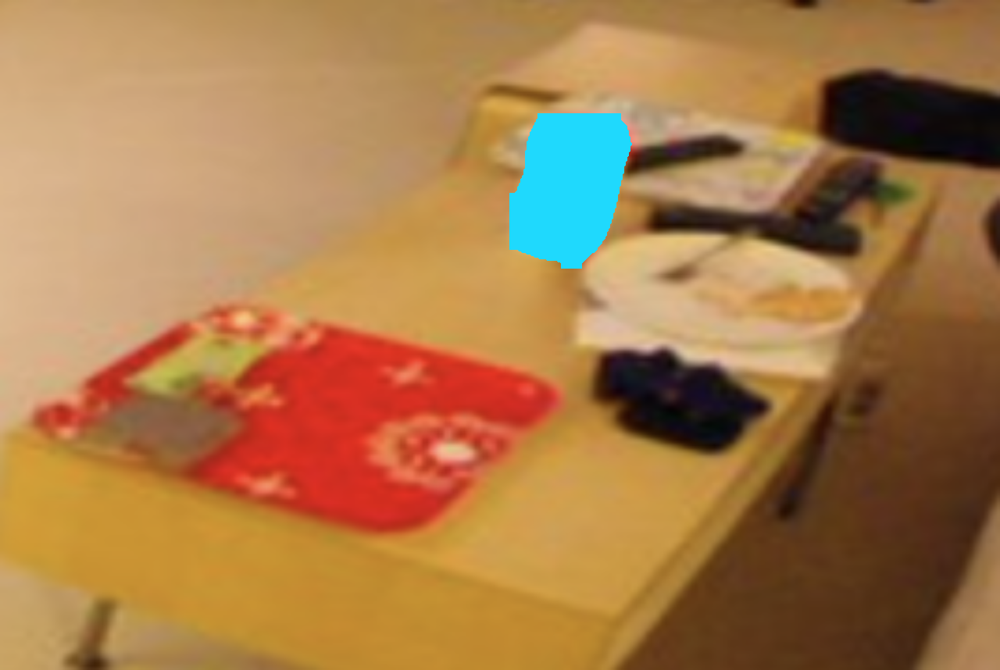

In [ ]:
#Zoom 3
img = segPipeline('./smallFork _zoom3  .png',verb=True,binary=False,resize=True,dim=(1280,858))
cv2_imshow(img)

In [ ]:
#Zoom 4
img = cv2.imread('./smallFork _zoom4.png')
seg = doSegmentation(img,verb=True)


0: 640x640 (no detections), 1526.1ms
Speed: 4.1ms preprocess, 1526.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
